# Data Preprocessing


## Importing Packages

In [1]:
import os
import sys
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.io as pio
import plotly.express as px
import matplotlib.pyplot as plt
import librosa, librosa.display
from IPython.display import Image 

In [2]:
#import amseg
#from amseg.amharicSegmenter import AmharicSegmenter
#sent_punct = []
#word_punct = []
#segmenter = AmharicSegmenter(sent_punct,word_punct)
#words = segmenter.amharic_tokenizer("አበበ በሶ በላ።")
#sentences = segmenter.tokenize_sentence("እአበበ በሶ በላ። ከበደ ጆንያ፤ ተሸከመ፡!ለምን?")
#print(words)
#print(sentences)

In [3]:
sns.set()
plt.style.use('ggplot')
%matplotlib inline
plt.style.use('ggplot')
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)
pd.set_option("expand_frame_repr", False)
pd.set_option('display.float_format', '{:.2f}'.format)
sys.path.append(os.path.abspath(os.path.join('../scripts')))

### Importing python Scripts from scripts directory

In [4]:
from clean_audio import CleanAudio
from file_handler import FileHandler
from audio_vis import AudioVis

In [5]:
clean_audio = CleanAudio()
file_handler = FileHandler()
audio_vis = AudioVis()

## Load Data


In this project, the ALFFA_PUBLIC dataset is used for the training and validation of the model. Data contains approximately 11k audio clips totaling around 18 hours of speech in Amharic. Each audio clip lasts a few seconds and comes with its transcription.
Data Features
- Input features (X): audio clips of spoken words
- Target labels (y): a text transcript of what was spoke

In [6]:
PATH_TRAIN_WAV = "../data/AMHARIC/train/wav/"
PATH_TEST_WAV = "../data/AMHARIC/test/wav/"
PATH_TRAIN_TEXT = "../data/AMHARIC/train/text"
PATH_TEST_TEXT = "../data/AMHARIC/test/text"

In [7]:
train_labels = os.listdir(PATH_TRAIN_WAV)
test_labels = os.listdir(PATH_TEST_WAV)
train_labels = [i.strip('.wav') for i in train_labels]
test_labels = [i.strip('.wav') for i in test_labels]
print(f"Total training data: {len(train_labels)}")
print(f"Total test data: {len(test_labels)}")
train_labels[:3], test_labels[:3]

Total training data: 667
Total test data: 359


(['tr_10300_tr100022', 'tr_10301_tr100023', 'tr_10302_tr100024'],
 ['01_d501021', '01_d501022', '01_d501023'])

## Create Metadata

Here we will prepare a metadata containing the name of the audio file, corresponding transcription, char length of each transcription, and the audio length in seconds. 

In [8]:
text_data, label_data = file_handler.read_data(PATH_TRAIN_TEXT, PATH_TEST_TEXT, train_labels, test_labels)
print(f"Total training data: {len(text_data)}")
print(f"Total test data: {len(label_data)}")
# text_data[:2], label_data[:2]

Total training data: 1026
Total test data: 1026


In [9]:
data = pd.DataFrame({'key': label_data, 'text': text_data})
data[:5]

,key,text
0,tr_10300_tr100022,ኢትዮጵያ በገና በ አል ዋዜማ ላይ ኤርትራውያን ን ማባረር ጀመረች ለሚ ለውም ገና ው የ ፈረንጆች ገና ነው
1,tr_10301_tr100023,ከዚያ ወዲህ ሶስት ወር ተጨምሮ እስካሁን ሰባት ሆኗል
2,tr_10302_tr100024,ያን ን ተቋም ነው ወደ ወያኔ ትራንስፖርት ኩባንያ ነት የ ለወጡት ብለዋል
3,tr_10303_tr100025,በ ምዝገባው ወቅት አንዳንዶቹ በ ሰጡት አስተያየት ወደ አገራቸው ለ መመለስ ከፍተኛ ፍላጐት እንዳ ላቸው ገልጸዋል
4,tr_10304_tr100026,ኢትዮጵያውያ ን ከ አስመራ እየ ተባረሩ ነው


In [10]:
y = [x in test_labels for x in data.key]
data["category"] = ["Test" if i else "Train" for i in y]
data.sample(5)

,key,text,category
711,03_d503029,በመሆኑ ም ሌሎች ክልሎች ም ከዚህ በ መማር ዜጐቻቸው ን ከ አደገኛ እጾች ለ መከላከል በ የ በኩላቸው ህግ ና ደንብ ሊ ያዘጋጁ እንደሚ ገባ መግፋት ና መገፋፋት ተገቢ ይመ ስላል,Test
723,04_d504023,ነገር ግን አንድ ቀን ራሱን በ ቻለ ሂደት ና መልክ ሊ ከናወን የሚችል የ ማይቀር ድርጊት ነው,Test
1002,19_d519033,ሀማ ን በ በርገር ላይ ም እንዲ ሁ ፋው ል በ መስራቱ በ ሁለት ቢጫ ከ ሜዳ ተወግ ዷል,Test
158,tr_10443_tr23145,በሩን እንዲ ህ በ ሀይል አታንኳኲ ብዬ ሽ አልነበር እንዴ,Train
63,tr_10358_tr100080,በ ቅርብ የሚ ያውቋቸው ና የ ትግል ጓደኞቻቸው ም እየ መሰከሩ ናቸው,Train


In [11]:
data["char_length"] = [len(i) for i in data.text]
data.sample(5)

,key,text,category,char_length
994,19_d519025,ፍየል ከ መድረሷ ቅጠል መበጠ ሷ,Test,20
740,05_d505022,በ ዶክተር ታዬ ወልደሰማያት ላይ የሚ ሰማው ውሳኔ በ ዳኛው አለ መገኘት ተራዘመ,Test,50
510,tr_10760_tr05128,በጣም ስለሚ ወደው የ መኮንን ወንድም መኮንን ን መኳ ነው የሚለው,Train,41
426,tr_10685_tr03102,በተለይ በ ተረጋጋ ሁኔታ አንቶ ኖ ቩ ድብደባ ሲ ያካሂድ በ ፊልም መቀረጹ ና መረጋጋቱ ን የሚ ያሳየው ደግሞ የ ፊልሙ ጥራት መሆኑን እንዳስ ደሰታቸው ብዙዎቹ ገልጸዋል,Train,105
37,tr_10334_tr100056,ኢትዮጵያውያ ን ን ያጐር ናቸው ለ ደህንነታቸው ብለን ነው,Train,36


In [12]:
duration_of_recordings = []
for i in range(data.shape[0]):
    path = ""
    if data.category[i] == "Train":
        path = PATH_TRAIN_WAV + data.key[i] + ".wav"
    else:
        path = PATH_TEST_WAV + data.key[i] + ".wav"


    audio, fs = librosa.load(path, sr=None)
    duration_of_recordings.append(float(len(audio) / fs))

In [13]:
data["duration"] = duration_of_recordings
data[:5]

,key,text,category,char_length,duration
0,tr_10300_tr100022,ኢትዮጵያ በገና በ አል ዋዜማ ላይ ኤርትራውያን ን ማባረር ጀመረች ለሚ ለውም ገና ው የ ፈረንጆች ገና ነው,Train,67,6.91
1,tr_10301_tr100023,ከዚያ ወዲህ ሶስት ወር ተጨምሮ እስካሁን ሰባት ሆኗል,Train,33,4.61
2,tr_10302_tr100024,ያን ን ተቋም ነው ወደ ወያኔ ትራንስፖርት ኩባንያ ነት የ ለወጡት ብለዋል,Train,46,4.48
3,tr_10303_tr100025,በ ምዝገባው ወቅት አንዳንዶቹ በ ሰጡት አስተያየት ወደ አገራቸው ለ መመለስ ከፍተኛ ፍላጐት እንዳ ላቸው ገልጸዋል,Train,71,6.78
4,tr_10304_tr100026,ኢትዮጵያውያ ን ከ አስመራ እየ ተባረሩ ነው,Train,27,3.58


## Data Exploration

In [14]:
data.describe()

,char_length,duration
count,1026.00,1026.00
mean,49.60,6.09
std,25.13,2.68
min,13.00,2.18
25%,31.00,4.22
50%,41.00,5.38
75%,64.00,7.42
max,163.00,18.18


### Transcription

In [15]:
words_in_data = pd.DataFrame(' '.join(data['text']).split())
words_in_data.columns = ['word']
words_data = words_in_data.groupby(['word']).agg({'word': 'count'})
words_data.columns = ['counts']
words_data.reset_index(inplace=True)
words_data = words_data.sort_values("counts", ascending=False)
words_data.head()

,word,counts
2913,የ,693
1181,በ,566
1888,ን,476
678,ም,305
1842,ነው,254


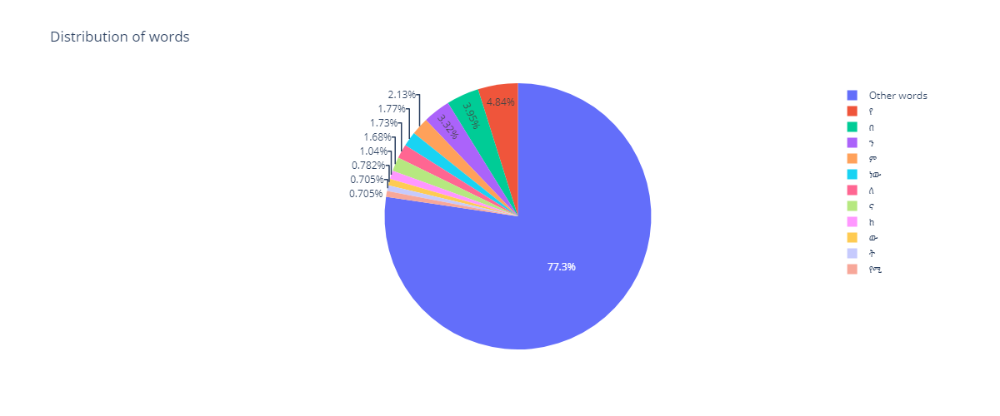

In [27]:
words_data.loc[words_data['counts'] < 100, 'word'] = 'Other words'
fig = px.pie(words_data, values='counts', names='word', title='Distribution of words', width=800, height=500)
Image(pio.to_image(fig, format='png', width=1200))

As we can see most of the transcriptions are a single character. In actuality, these characters are part of the word.

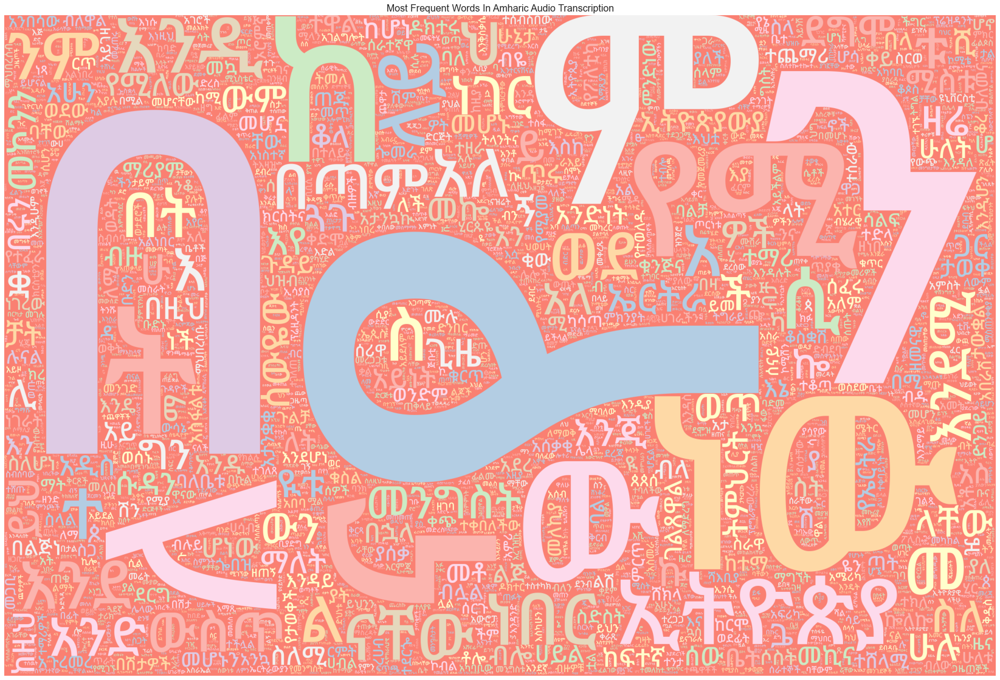

In [28]:
audio_vis.get_wc(data, 'text', [])

The word cloud also shows the problem in the transcription. Any Amharic language speaker knows these characters are part of a word that is next to them.


### Audio


In [16]:
def get_paths(category, key):
  if(category == "Train"):
    return PATH_TRAIN_WAV + key + ".wav"
  else:
    return PATH_TEST_WAV + key + ".wav"

In [17]:
path_to_sample = get_paths(data.category[0], data.key[0])
sample_audio, sr = file_handler.read_audio_signal(path_to_sample)
print(sr)
print(sample_audio)

22000
[-0.12490972 -0.14187829 -0.11962315 ... -0.12272501 -0.14258936
 -0.09304702]


In [18]:
audio_vis.play_audio(sample_audio)

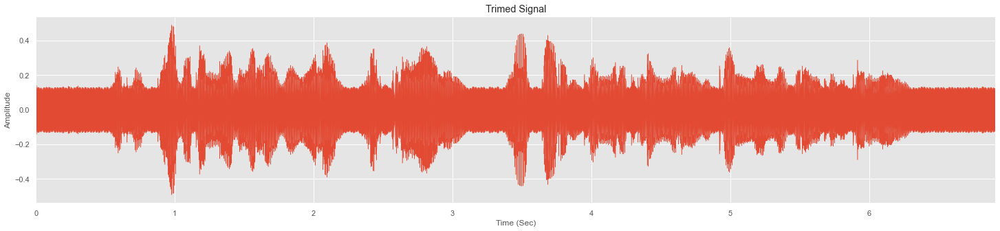

In [17]:
audio_vis.wav_plot(sample_audio, 'Trimed Signal', 'Amplitude', 'Time (Sec)')

FFT spectrum
Fourier transform also known as the fast fourier transform
Decomposes complex periodic sound like the one above into sum
of sine waves oscilating at
different frequencies
The FFT moves us from the time domain to the frequency domain
It should be noted that with FFT we loose information about time

<function matplotlib.pyplot.show(close=None, block=None)>

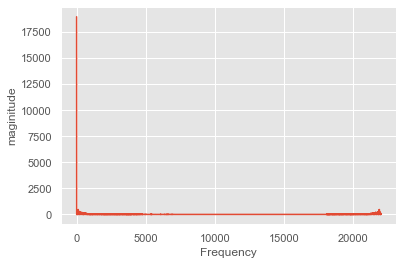

In [34]:
import scipy
fft = np.fft.fft(sample_audio)
maginitude =np.abs(fft)
frequency =np.linspace(0,sr, len(maginitude))
plt.plot(frequency,maginitude)
plt.xlabel("Frequency")
plt.ylabel("maginitude")
plt.show

In [ ]:
#my practice
AUDIO_FILE = 'audio.wav'
samples, sample_rate = librosa.load(AUDIO_FILE, sr=None)
#plt.figure(figsize=(14, 5))
#librosa.display.waveplot(samples, sr=sample_rate)
sgram = librosa.stft(samples)
librosa.display.specshow(sgram)

# use the mel-scale instead of raw frequency
sgram_mag, _ = librosa.magphase(sgram)
mel_scale_sgram = librosa.feature.melspectrogram(S=sgram_mag, sr=sample_rate)
librosa.display.specshow(mel_scale_sgram)

# use the decibel scale to get the final Mel Spectrogram
mel_sgram = librosa.amplitude_to_db(mel_scale_sgram, ref=np.min)
librosa.display.specshow(mel_sgram, sr=sample_rate, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')

#Center MFCC coefficient dimensions to the mean and unit variance
import sklearn
mfcc = librosa.feature.mfcc(samples, sr=sample_rate)

mfcc = sklearn.preprocessing.scale(mfcc, axis=1)
librosa.display.specshow(mfcc, sr=sample_rate, x_axis='time')

print (f'MFCC is of type {type(mfcc)} with shape {mfcc.shape}')
# MFCC is of type <class 'numpy.ndarray'> with shape (20, 134)

In the power  spectrum , more energy is concetrated in the lower frequencies , the higher you go with the frequencies the 
less energy 

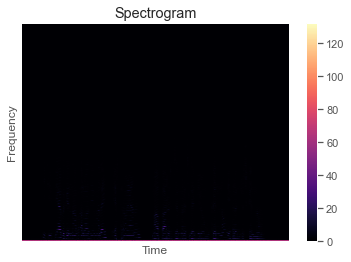

In [18]:
#Because of the FTT loos of time we need to find away of 
#seeing how things change with time 
#The Short term Fourier transform is the solution to 
#the FTT limitation

#The STFT
#it computes several FTT at different intervals and in doing so it preserves information about time 
#The different intervals at which we perform the FTT is given by the fixed frame size (eg, 2048 samples)
#This gives us a spectrogram which is a representation of magnitude as a function of frequency and time
#
#spectogram stft


n_fft =2048
hop_length =512

stft =librosa.core.stft(sample_audio, hop_length=hop_length, n_fft=n_fft)
spectrogram = np.abs(stft)

librosa.display.specshow(spectrogram,sr=sr, hop_length=hop_length)
plt.title("Spectrogram")
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.colorbar()
plt.show()

Most of the frequencies have very low aplititude, so they contribute littel to the overall sound

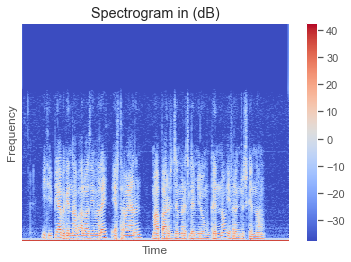

In [19]:
#log spectrogram 
log_spectrogram = librosa.amplitude_to_db(spectrogram)
librosa.display.specshow(log_spectrogram,sr=sr, hop_length=hop_length)
plt.title("Spectrogram in (dB)")
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.colorbar()
plt.show()

Most of the energy is concetrated on the lower frequencies 

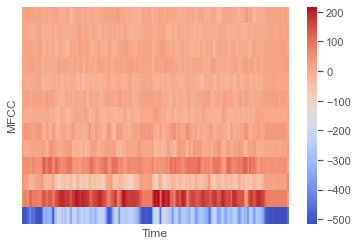

In [20]:
#MFCCs
#Mel frequency Cepstral Cooefficients (MFCCs)
#The MFCC are capble of capture the different quality of sound like capturing the timbraltextual 
#aspects of sound
#MFCC are also a frequency domain feature 
#The greatest advantage of MFCCs over a spectrogram is that they approximate the human 
#auditory system .. it is important for deep learning 
#Mostly 13 -40 coeficients are used in audio music which are caluculated at each frame 

#they are used ofr speech reconginitions , music genre classification and music instrument classification
MFCCs = librosa.feature.mfcc(sample_audio, n_fft = n_fft, hop_length=hop_length, n_mfcc=13)
librosa.display.specshow(MFCCs,sr=sr, hop_length=hop_length)
plt.xlabel("Time")
plt.ylabel("MFCC")
plt.colorbar()
plt.show()

In [21]:
#Print the timeline of the audio 
AUDIO_FILE = 'audio.wav'
#samples, sample_rate = librosa.load(AUDIO_FILE, sr=None)
y, sr = librosa.load(AUDIO_FILE, sr=None) #you just need to make sure your audio is in the same folder in which you are coding or else you can change the path as per your requirement
time = np.arange(0,len(y))/sr
print(time) # prints timeline of arabic6

[0.0000000e+00 6.2500000e-05 1.2500000e-04 ... 4.6078125e+00 4.6078750e+00
 4.6079375e+00]


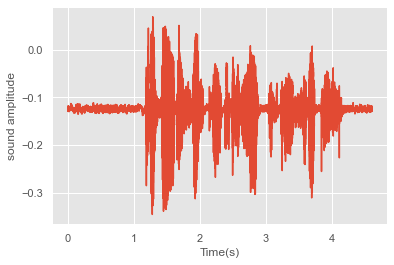

In [28]:
#Another way to plot time vs amplititude

y, sr = librosa.load(AUDIO_FILE, sr=None)
time = np.arange(0,len(y))/sr
fig, ax = plt.subplots()
ax.plot(time,y)
ax.set(xlabel='Time(s)',ylabel='sound amplitude')
plt.show()

[104.16666667]


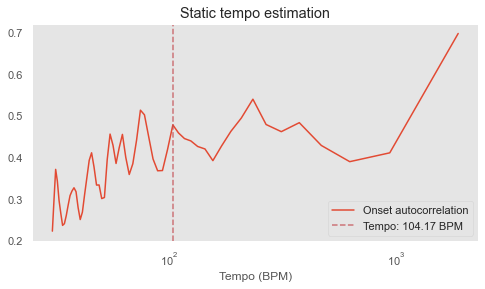

In [30]:
#ploting and finding the estimated tempo
onset_env = librosa.onset.onset_strength(y, sr=sr)
tempo = librosa.beat.tempo(onset_envelope=onset_env, sr=sr)
print(tempo)
tempo = np.asscalar(tempo)
# Compute 2-second windowed autocorrelation
hop_length = 512
ac = librosa.autocorrelate(onset_env, 2 * sr // hop_length)
freqs = librosa.tempo_frequencies(len(ac), sr=sr,hop_length=hop_length)
# Plot on a BPM axis.  We skip the first (0-lag) bin.
plt.figure(figsize=(8,4))
plt.semilogx(freqs[1:], librosa.util.normalize(ac)[1:],label='Onset autocorrelation')
plt.axvline(tempo, 0, 1, color='r', alpha=0.75, linestyle='--',label='Tempo: {:.2f} BPM'.format(tempo))
plt.xlabel('Tempo (BPM)')
plt.grid()
plt.title('Static tempo estimation')
plt.legend(frameon=True)
plt.axis('tight')
plt.show()

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
///
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


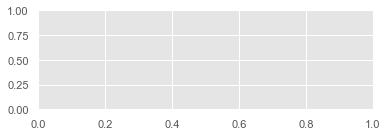

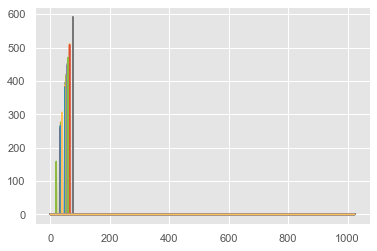

In [31]:
#finding and plotting the pitch 
pitches, magnitudes = librosa.piptrack(y=y, sr=sr)
print(pitches)
print('///')
print(magnitudes)
plt.subplot(212)
plt.show()
plt.plot(pitches)
plt.show()

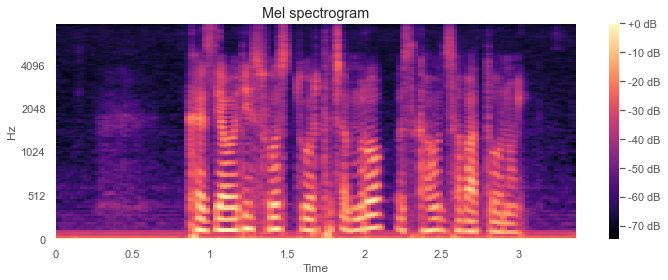

In [32]:
#cumpute a mel-scaled spectrogram
librosa.feature.melspectrogram(y=y, sr=sr)

D = np.abs(librosa.stft(y))**2
S = librosa.feature.melspectrogram(S=D)
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128,fmax=8000)
plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.power_to_db(S,ref=np.max),y_axis='mel', fmax=8000,x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel spectrogram')
plt.tight_layout()
plt.show()

## Clean Audio

Preprocessing of speech signals is considered a crucial step in the development of a robust and efficient speech recognition system. Here we will try to remove the silence / unvoiced part of the speech. We start by taking three sample audio signals so we can observe the effect of cleaning on the audio.


In [19]:
signals = []
for i in range(3):
    path_to_sample = get_paths(data.category[i], data.key[i])
    sample_audio, sr = file_handler.read_audio_signal(path_to_sample)
    signals.append(sample_audio)

### mean normalization

Normalizing will reduce undesirable noise in our signal and give us a clean audio file.

In [20]:
normal_signal = []
for s in signals:
    normal_signal.append(clean_audio.normalize_audio(s))


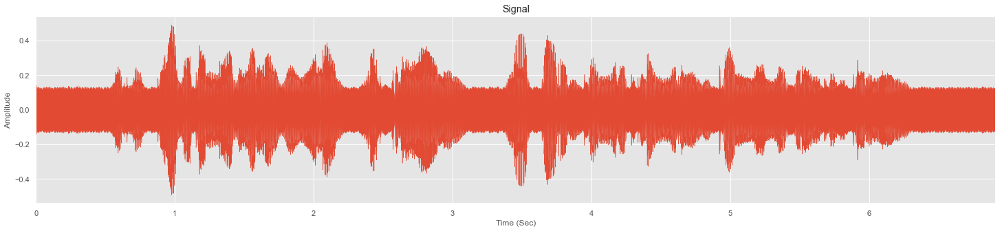

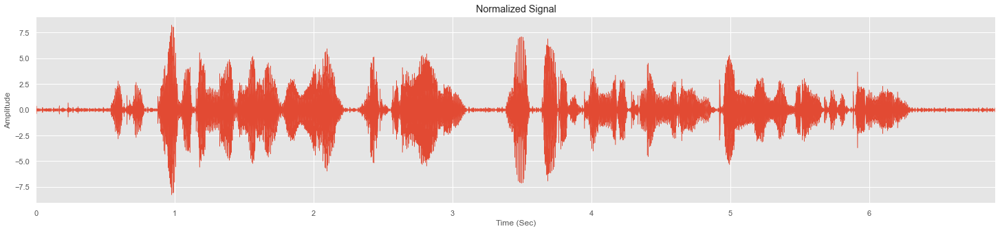


					---------------------------------------------



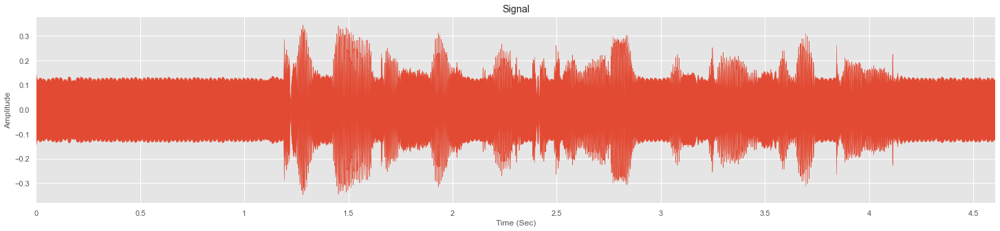

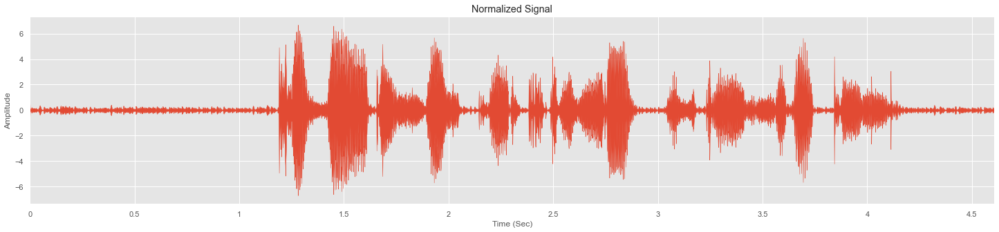


					---------------------------------------------



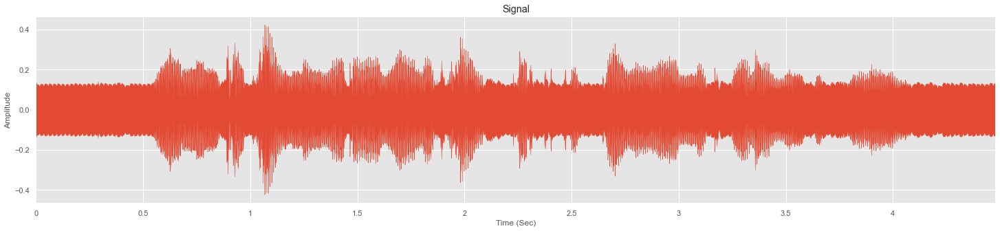

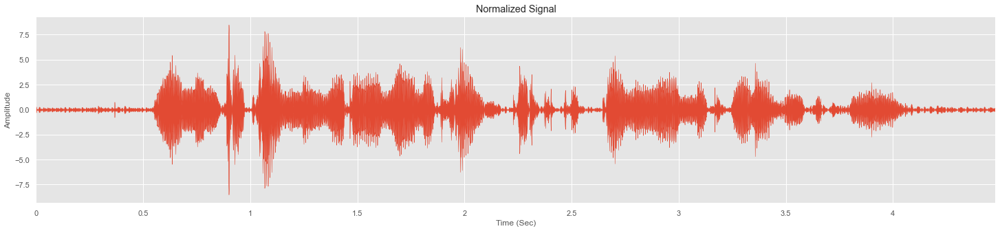


					---------------------------------------------



In [21]:
for s, n in zip(signals, normal_signal):
  audio_vis.wav_plot(s, 'Signal', 'Amplitude', 'Time (Sec)')
  audio_vis.wav_plot(n, 'Normalized Signal', 'Amplitude', 'Time (Sec)')
  print("\n\t\t\t\t\t---------------------------------------------\n")


In [22]:
audio_vis.play_audio(normal_signal[2])


### Trim
Trim leading and trailing silence from an audio signal. The split function required to mention the magnitude of low volumes in decibels and in reference to the max value present in the audio signal.

In [39]:
def calc_ref_dec(signal):
  y = librosa.amplitude_to_db(abs(sample_audio))
  refDBVal = np.max(y)
  n_fft = 2048
  S = librosa.stft(sample_audio, n_fft=n_fft, hop_length=n_fft // 2)
  D = librosa.amplitude_to_db(np.abs(S), ref=np.max)
  return np.max(abs(D))

In [40]:
calc_ref_dec(s)

80.0

As you observe, max value of audio is around 80 db and we need to have the ‘top_db’ value mentioned such that any value that are lesser than ’80 — top_db’ value would be considered as mute sections.

Default value of ‘top_db’ as per librosa documentation is ‘60’ and in most of the cases it gives a decent results. Here we will go with 30 db, meaning audios below 50 db will be cut off.


In [42]:
clean_signal = []
for s in normal_signal:
    clean_signal.append(clean_audio.trim_audio(s, 20))#30


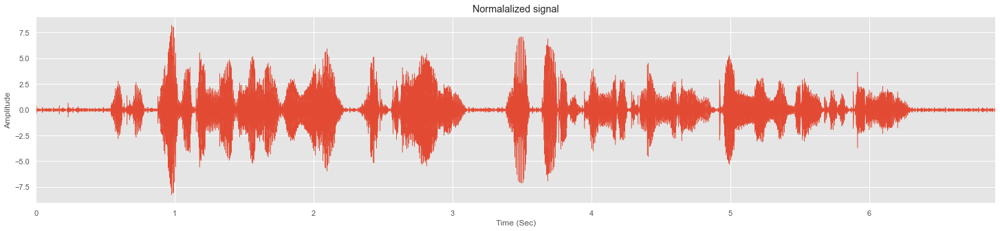

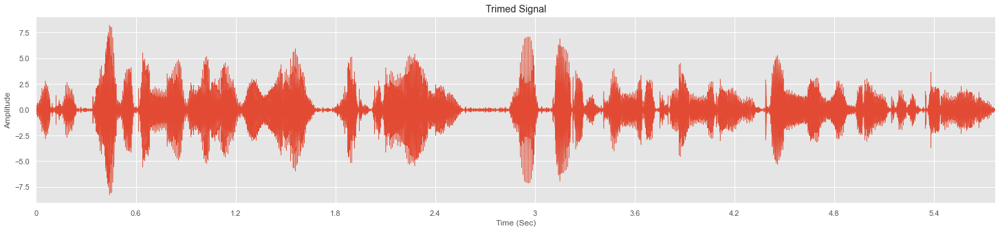


					---------------------------------------------



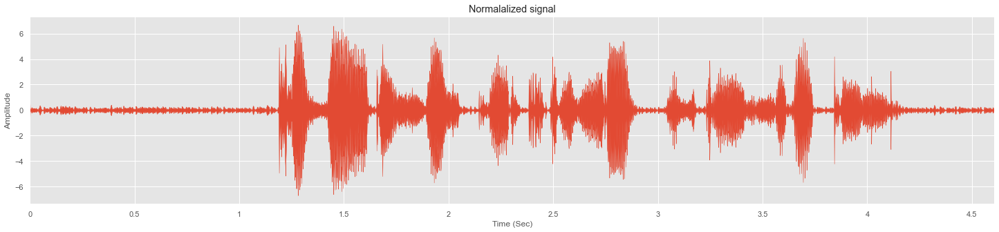

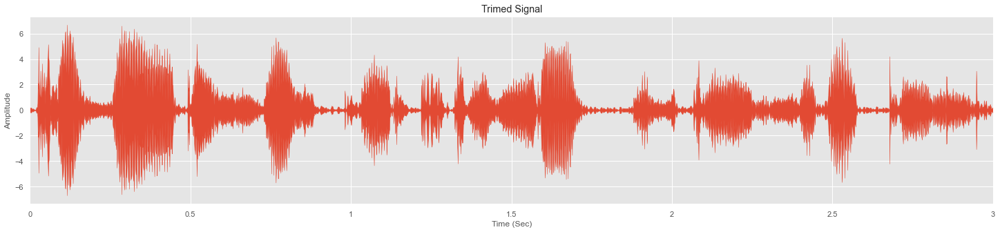


					---------------------------------------------



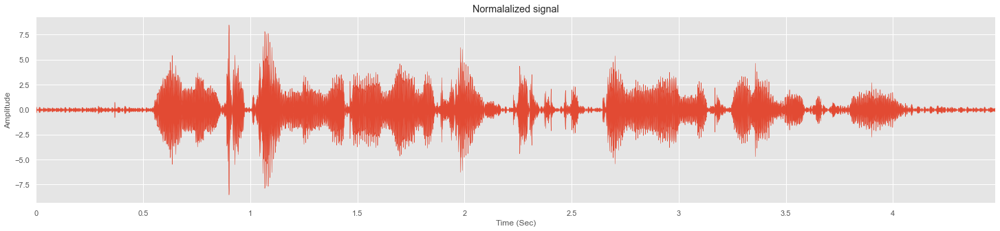

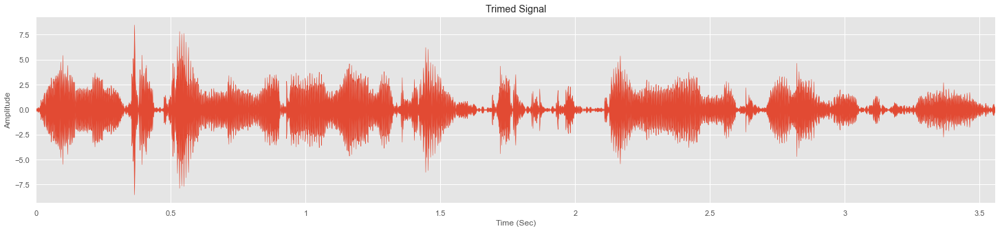


					---------------------------------------------



In [43]:
for n, c in zip(normal_signal, clean_signal):
    audio_vis.wav_plot(n, 'Normalalized signal', 'Amplitude', 'Time (Sec)')
    audio_vis.wav_plot(c, 'Trimed Signal', 'Amplitude', 'Time (Sec)')
    print("\n\t\t\t\t\t---------------------------------------------\n")


In [47]:
audio_vis.play_audio(normal_signal[2])

### Split
As before we will use Libros for removing the silence in the audio signals. Libros split function returns a NumPy array containing non-silent intervals in the audio signal. The function does not return any audio, just the start, and end points of the non-silent slices in the audio. By concatenating the non-silent segments, We can decrease the silence in each audio signal.

In [48]:
clean_signal = []
for s in normal_signal:
    clean_signal.append(clean_audio.split_audio(s, 20))#30

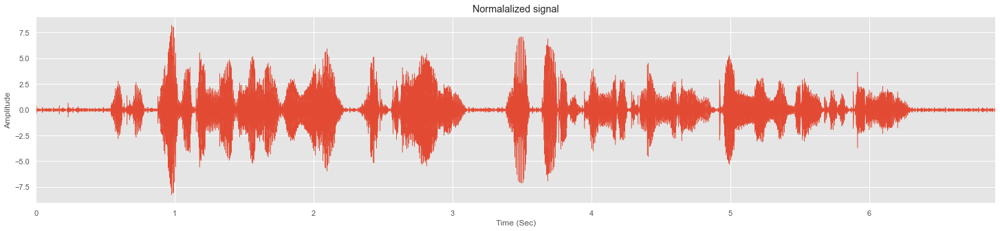

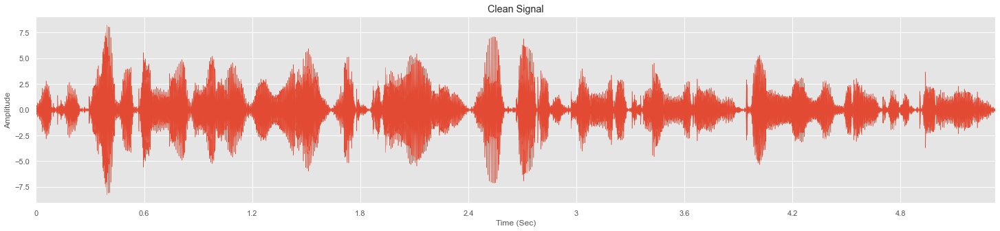


					---------------------------------------------



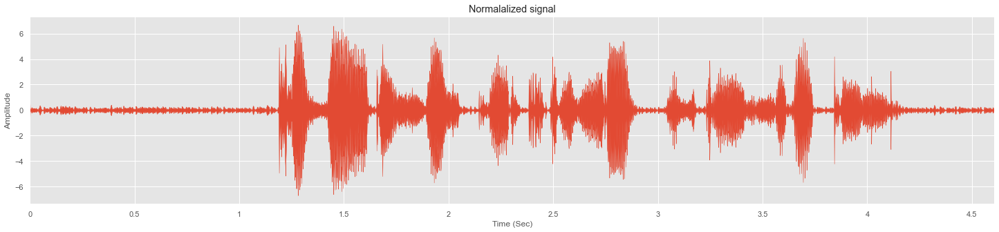

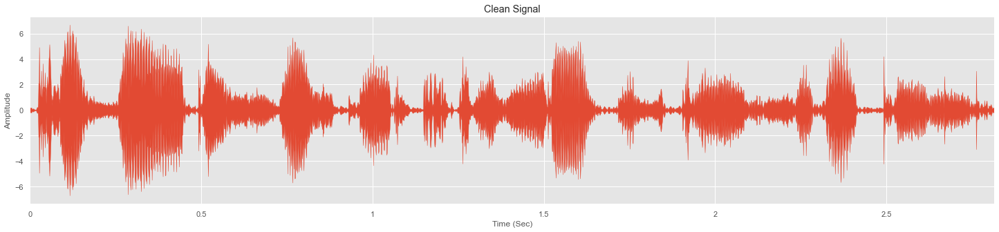


					---------------------------------------------



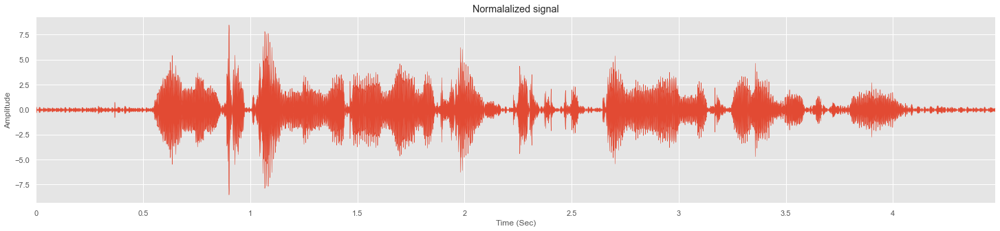

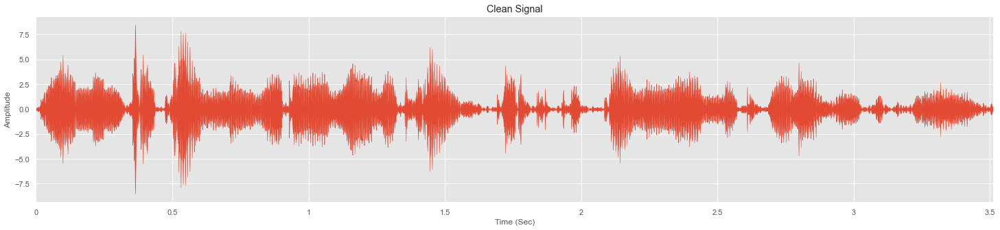


					---------------------------------------------



In [49]:
for n, c in zip(normal_signal, clean_signal):
    audio_vis.wav_plot(n, 'Normalalized signal', 'Amplitude', 'Time (Sec)')
    audio_vis.wav_plot(c, 'Clean Signal', 'Amplitude', 'Time (Sec)')
    print("\n\t\t\t\t\t---------------------------------------------\n")

In [51]:
audio_vis.play_audio(clean_signal[2])

## Clean Text

In [24]:
clean_word_dict = file_handler.read_text("../data/AMHARIC/train/text.txt")
clean_word_list = []
for i in clean_word_dict:
  clean_word_list.append(i.split(" ")[1])

clean_word_list[:10]

['ያንደኛ', 'የተ', 'በ', 'ወሬው', 'ኢትዮጵያዊ', 'ከ', 'እህቶቹ', 'እናንተ', 'አንቶኔሊ', 'ግን']

In [25]:
def get_clean_word(words, position):
  word = temp_word = words[position]
  position = position + 1
  move_with_error = 0
  # print("---------------------------------")
  while((position < len(words) - 1) and (move_with_error < 5)):  # Give it five tries
    # print(f"word :{word} | temp_word: {temp_word} | position {position} | move_with_error: {move_with_error}")
    new_word = temp_word + words[position]
    if(new_word in clean_word_list):
      temp_word = new_word
      word = temp_word
      position = position + 1
      move_with_error = 0
    else:
      temp_word = new_word
      move_with_error = move_with_error + 1
  return word, position


In [26]:
clean_text = []
for sent in data.text[1:3]:
  words = sent.split(" ")
  clean_sent = []
  position = 0
  while(position < len(words)-1):
    clean_word, position = get_clean_word(words, position)
    clean_sent.append(clean_word)
  clean_text.append(" ".join(clean_sent))
  print(f"\nsentance: {sent}")
  print(f"clean sentance: {(' '.join(clean_sent))}\n\n")


sentance: ከዚያ ወዲህ ሶስት ወር ተጨምሮ እስካሁን ሰባት ሆኗል
clean sentance: ከዚያ ወዲህ ሶስት ወር ተጨምሮ እስካሁን ሰባት



sentance: ያን ን ተቋም ነው ወደ ወያኔ ትራንስፖርት ኩባንያ ነት የ ለወጡት ብለዋል
clean sentance: ያን ን ተቋም ነው ወደ ወያኔ ትራንስፖርት ኩባንያ ነት የ ለወጡት




In [27]:
clean_text = []
count = 0
for sent in data.text:
  words = sent.split(" ")
  clean_sent = []
  position = 0
  while(position < len(words)):
    clean_word, position = get_clean_word(words, position)
    clean_sent.append(clean_word)

  if((count % 1000) == 0):
      print(f"Done: {(count/data.shape[0]*100):.2f}%")
  count += 1

  clean_text.append(" ".join(clean_sent))

Done: 0.00%
Done: 97.47%


In [28]:
data["clean_text"] = clean_text
data[["clean_text", "text"]].tail(5)

,clean_text,text
1021,በ ትግራይ ህዝብ ስ ም የ ተቋቋመው ኤፈርት አዲስ የ ቴሌቪዥን ጣቢያ ሊ ከፍት መሆኑን ለ ጋዜጣዋ ዜና ዴስ ክ በ ኢንተርኔት የ ደረሰው ዘገባ አ መለከተ,በ ትግራይ ህዝብ ስ ም የ ተቋቋመው ኤፈርት አዲስ የ ቴሌቪዥን ጣቢያ ሊ ከፍት መሆኑን ለ ጋዜጣዋ ዜና ዴስ ክ በ ኢንተርኔት የ ደረሰው ዘገባ አ መለከተ
1022,ከዚህ ም ሌላ የ ቴሌቪዥ ኗ ጋዜጠኛ እንግዳ ዘር ነጋ እግሯ ን ኦፕራ ሲ ዩን የ ሆነች ሲሆን አሁን ከ ኦፕራ ሲዮኑ በኋላ በደህና ሁኔታ ትገኛ ለች ሲል ጠቁ ሟል,ከዚህ ም ሌላ የ ቴሌቪዥ ኗ ጋዜጠኛ እንግዳ ዘር ነጋ እግሯ ን ኦፕራ ሲ ዩን የ ሆነች ሲሆን አሁን ከ ኦፕራ ሲዮኑ በኋላ በደህና ሁኔታ ትገኛ ለች ሲል ጠቁ ሟል
1023,ዘ ታይም ዘጋቢ እንደ ዘገበው ትልቁ የ ምግብ ማመላለስ ተግባር ወደ ዲ ና ን የ ተደረገው ከ ሀምሳ ቀናት በፊት ነበር,ዘ ታይም ዘጋቢ እንደ ዘገበው ትልቁ የ ምግብ ማመላለስ ተግባር ወደ ዲ ና ን የ ተደረገው ከ ሀምሳ ቀናት በፊት ነበር
1024,ወደ ከተማ በሚ መጡ እንግዶች ላይ ድንጋጤ ን ይ ፈጥራል በሚል ችግሩ ባለ በት ታፍኖ እንዲያዝ ተደርጓል,ወደ ከተማ በሚ መጡ እንግዶች ላይ ድንጋጤ ን ይ ፈጥራል በሚል ችግሩ ባለ በት ታፍኖ እንዲያዝ ተደርጓል
1025,ዛሬ ም ይህ ጽሁፍ እስከ ተጻፈ በት ድረስ ከ አንድ ሺ ዘጠኝ መቶ አርባ አመተ ምህረት ጀምሮ በ ዚሁ ከተማ በ መኖር ላይ ይገኛሉ,ዛሬ ም ይህ ጽሁፍ እስከ ተጻፈ በት ድረስ ከ አንድ ሺ ዘጠኝ መቶ አርባ አመተ ምህረት ጀምሮ በ ዚሁ ከተማ በ መኖር ላይ ይገኛሉ


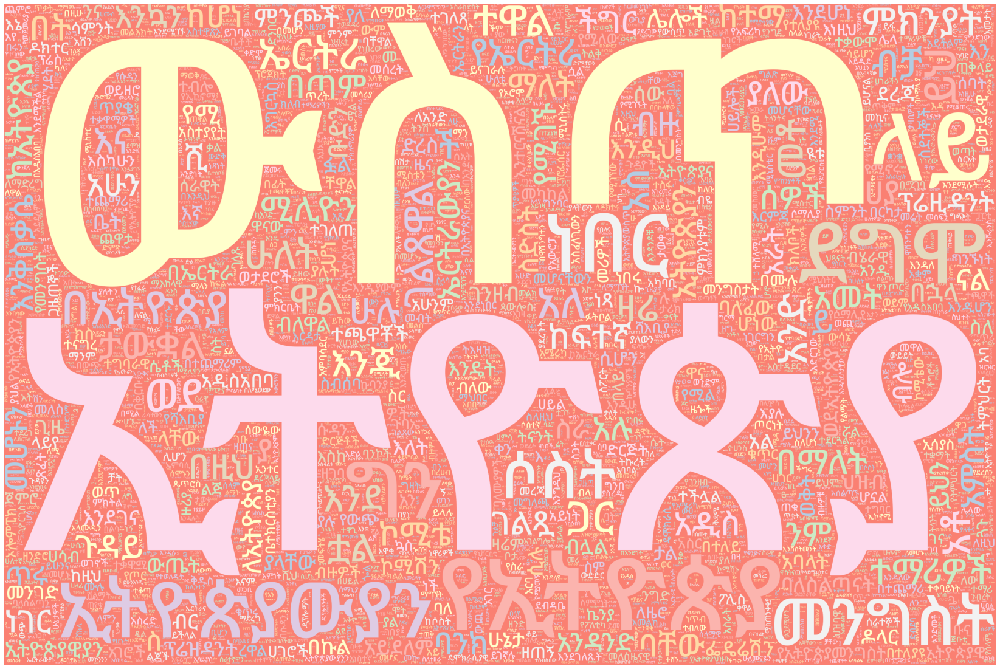

In [18]:
get_wc(data, 'text', custom_stopwords)

As we can see the word cloud is much better for the clean transcription.


In [29]:
data.to_csv('../data/clean_data.csv')

In [30]:
data = pd.read_csv(r'../data/clean_data.csv')
data.head(5)

,Unnamed: 0,key,text,category,char_length,duration,clean_text
0,0,tr_10300_tr100022,ኢትዮጵያ በገና በ አል ዋዜማ ላይ ኤርትራውያን ን ማባረር ጀመረች ለሚ ለውም ገና ው የ ፈረንጆች ገና ነው,Train,67,6.91,ኢትዮጵያ በገና በ አል ዋዜማ ላይ ኤርትራውያን ን ማባረር ጀመረች ለሚ ለውም ገና ው የ ፈረንጆች ገና ነው
1,1,tr_10301_tr100023,ከዚያ ወዲህ ሶስት ወር ተጨምሮ እስካሁን ሰባት ሆኗል,Train,33,4.61,ከዚያ ወዲህ ሶስት ወር ተጨምሮ እስካሁን ሰባት ሆኗል
2,2,tr_10302_tr100024,ያን ን ተቋም ነው ወደ ወያኔ ትራንስፖርት ኩባንያ ነት የ ለወጡት ብለዋል,Train,46,4.48,ያን ን ተቋም ነው ወደ ወያኔ ትራንስፖርት ኩባንያ ነት የ ለወጡት ብለዋል
3,3,tr_10303_tr100025,በ ምዝገባው ወቅት አንዳንዶቹ በ ሰጡት አስተያየት ወደ አገራቸው ለ መመለስ ከፍተኛ ፍላጐት እንዳ ላቸው ገልጸዋል,Train,71,6.78,በ ምዝገባው ወቅት አንዳንዶቹ በ ሰጡት አስተያየት ወደ አገራቸው ለ መመለስ ከፍተኛ ፍላጐት እንዳ ላቸው ገልጸዋል
4,4,tr_10304_tr100026,ኢትዮጵያውያ ን ከ አስመራ እየ ተባረሩ ነው,Train,27,3.58,ኢትዮጵያውያ ን ከ አስመራ እየ ተባረሩ ነው


## Save the data in numpy format

Saving the data in numpy format will increase the read spread significantly


In [ ]:
file_handler.save_audio_as_numpy(data, 8000)